In [59]:
import pandas as pd
import numpy as np
import scipy as sp
import seaborn as sb
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import sys, os, collections, warnings
import pandas.api.types as types
from collections import *
from geopy.geocoders import Nominatim

from sklearn.preprocessing import *
from sklearn.pipeline import Pipeline
from sklearn.model_selection import *
from sklearn.feature_selection import *
from sklearn.compose import ColumnTransformer
from sklearn.metrics import *
from sklearn.impute import SimpleImputer

# classification models
from sklearn.linear_model import RidgeClassifier
from sklearn.naive_bayes import ComplementNB
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

# regression models
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)

# 1. Data overview

In [2]:
data = pd.read_csv('data/weatherAUS.csv')
# data overview
print('data size:', data.shape)
data.sample(10)

data size: (145460, 23)


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
81973,2011-10-03,Dartmoor,1.7,17.9,0.0,2.4,10.5,E,33.0,E,NNE,6.0,13.0,98.0,50.0,1024.5,1021.7,NaN,NaN,6.6,17.3,No,No
53611,2013-05-27,MountGinini,-0.4,6.1,0.0,NaN,NaN,ENE,41.0,E,E,20.0,13.0,74.0,74.0,NaN,NaN,NaN,NaN,1.7,4.3,No,No
7567,2013-05-27,Cobar,5.6,18.2,0.0,2.2,NaN,ESE,24.0,ESE,ENE,9.0,7.0,79.0,42.0,1028.4,1025.9,7.0,3.0,11.0,17.5,No,No
64507,2009-11-13,MelbourneAirport,11.9,28.5,0.0,7.4,10.3,S,31.0,SSW,SSE,9.0,17.0,76.0,36.0,1021.4,1016.7,8.0,4.0,16.3,26.7,No,No
76279,2012-08-22,Portland,5.0,17.2,3.0,0.8,6.3,SSE,54.0,N,NNE,15.0,13.0,89.0,61.0,1004.0,997.3,5.0,5.0,6.1,16.1,Yes,Yes
63810,2016-06-10,Sale,8.5,16.6,0.2,NaN,NaN,WNW,54.0,W,NW,24.0,30.0,72.0,57.0,1015.9,1014.5,NaN,7.0,11.8,15.3,No,No
90366,2009-04-06,GoldCoast,20.4,27.1,2.0,NaN,NaN,SSE,46.0,S,SSE,24.0,35.0,99.0,75.0,1016.0,1013.4,NaN,NaN,21.6,25.7,Yes,Yes
29262,2014-12-25,Richmond,19.1,33.1,0.6,NaN,NaN,WSW,48.0,N,ENE,13.0,17.0,75.0,50.0,1011.0,1003.5,6.0,NaN,23.1,31.9,No,Yes
13037,2011-09-28,Moree,14.2,17.9,0.0,5.6,0.0,NE,44.0,NE,NE,30.0,11.0,73.0,91.0,1016.9,1014.6,8.0,8.0,15.8,15.7,No,Yes
44293,2013-12-10,Wollongong,21.8,31.5,0.0,NaN,NaN,W,57.0,NW,WNW,19.0,22.0,44.0,22.0,1002.1,1002.7,NaN,NaN,26.8,30.5,No,No


In [3]:
data.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


# 2. Data explore

In [4]:
# find latitudes and longitudes of each location
geolocator = Nominatim(user_agent="my_user_agent")
country = 'Australia'
latitudes, longitudes = {}, {}
for place in data['Location']:
    if not place in latitudes:
        place1 = place
        for i in range(1, len(place1)):
            if place1[i].isupper():
                place1 = place1[: i] + ' ' + place1[i:]
                break
        loc = geolocator.geocode(place1+','+ country)
        try:
            latitudes[place] = loc.latitude
            longitudes[place] = loc.longitude
        except:
            latitudes[place] = None
            longitudes[place] = None

data['Latitude'] = data['Location'].replace(latitudes)
data['Longitude'] = data['Location'].replace(longitudes)

In [5]:
# get day of year and year from Date
data['Date'] = pd.to_datetime(data['Date'])
data['day of year'] = data['Date'].dt.dayofyear
data['year'] = data['Date'].dt.year
df = data.drop(columns = ['Date', 'Location'])

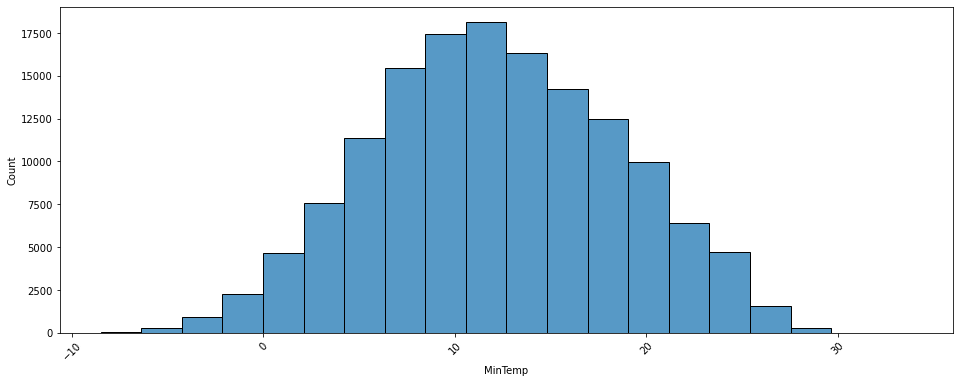

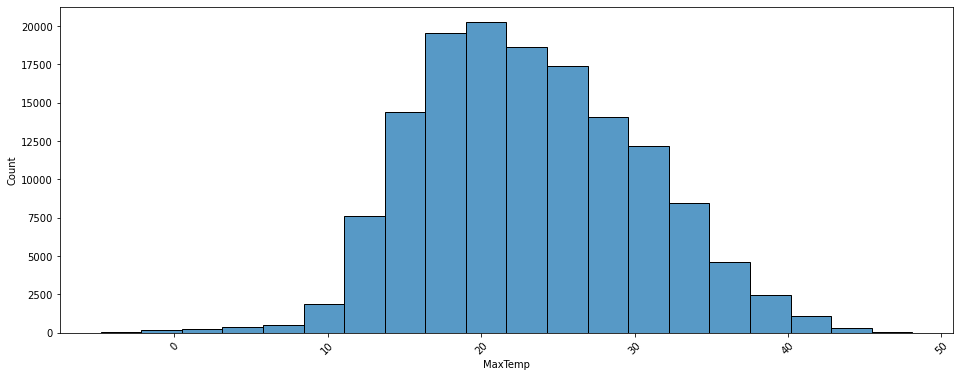

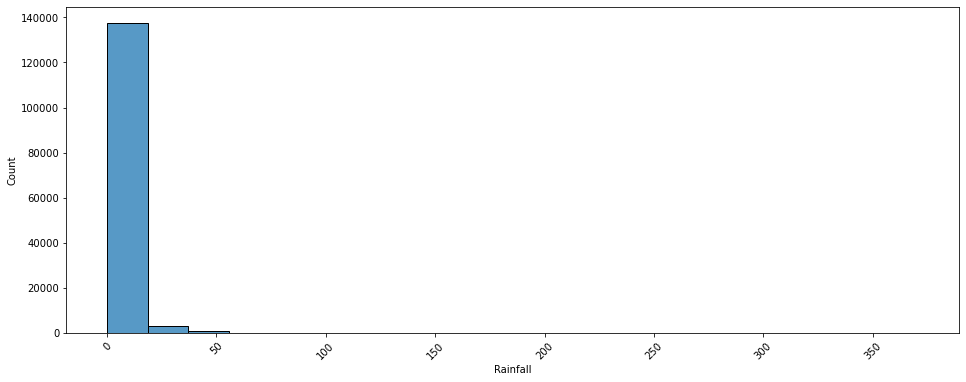

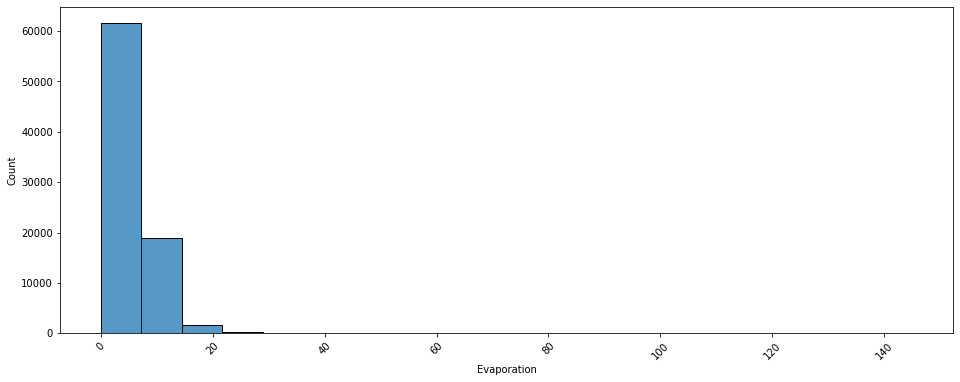

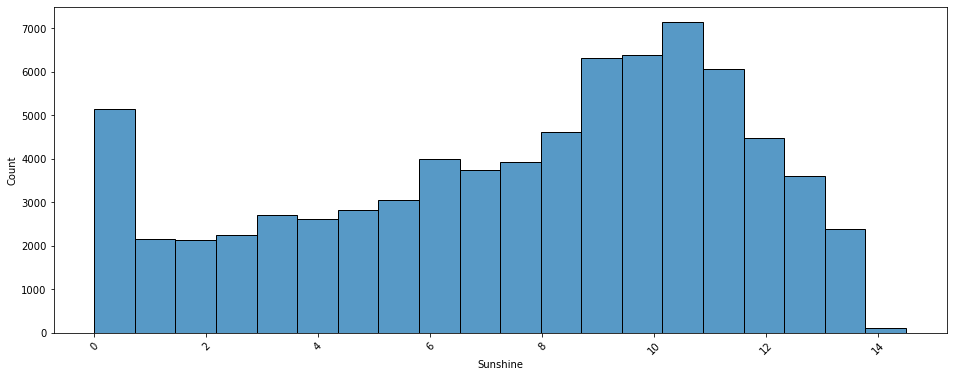

...

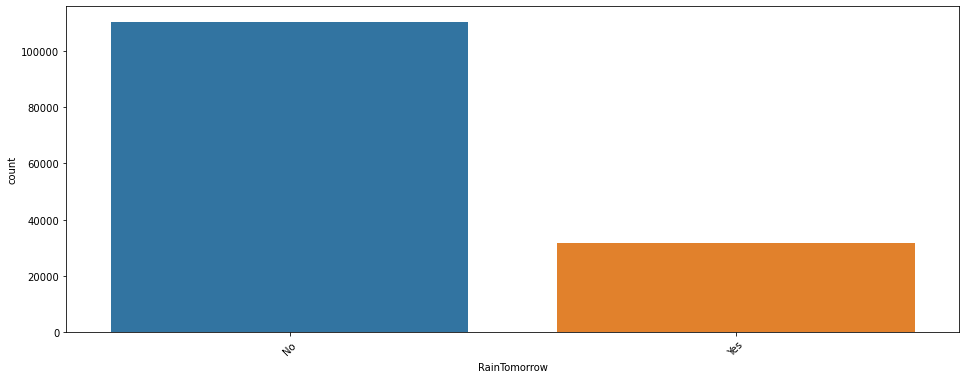

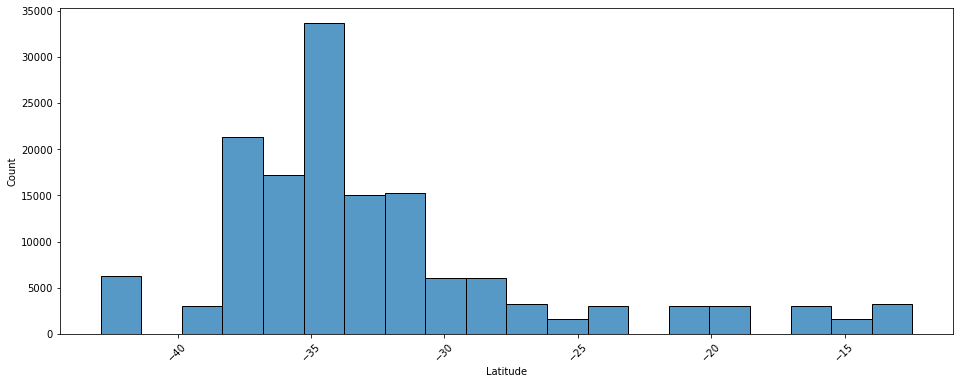

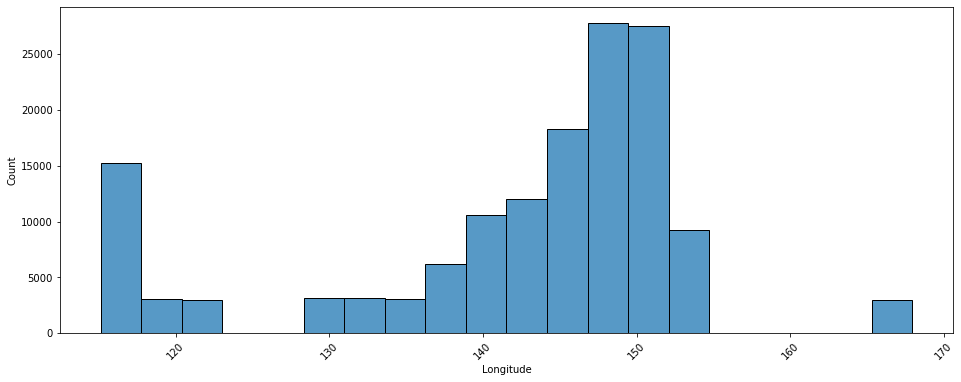

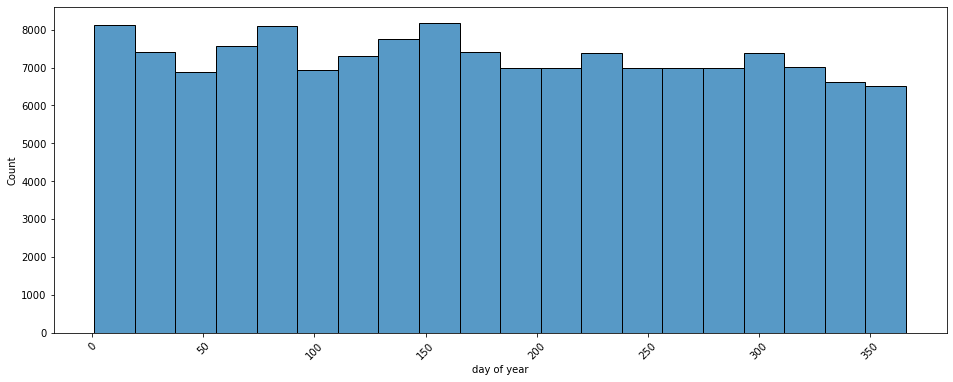

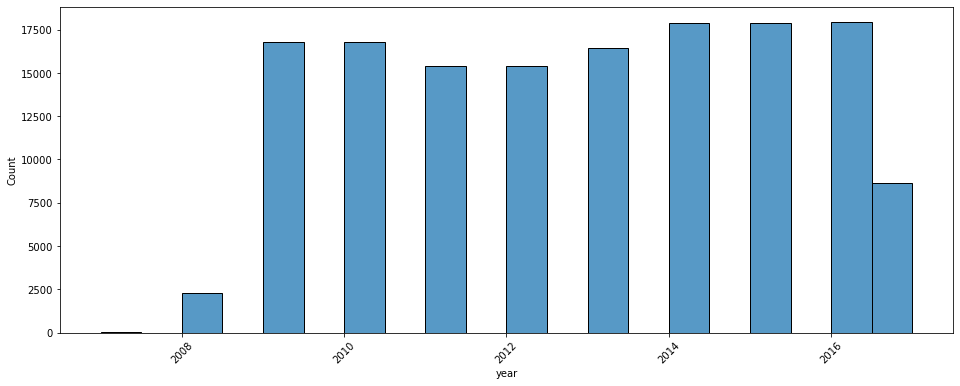

In [6]:
# univariate data explore
for column in df.columns:
    fig = plt.figure(figsize = (16, 6))
    if types.is_object_dtype(df[column].dtype):
        ax = sb.countplot(x = column, data = df)
    else:
        ax = sb.histplot(x = column, data = df, bins = 20)
    for xticker in ax.get_xticklabels():
        xticker.set_rotation(45)
    plt.show()

In [7]:
df['RainToday'] = df['RainToday'].replace({'Yes': 1, 'No': 0})
df['RainTomorrow'] = df['RainTomorrow'].replace({'Yes': 1, 'No': 0})
df = df[df['RainTomorrow'].notna()]

In [8]:
# bivariate data explore
# get mean and count of 'RainTomorrow' by each column value
def getMeanCnt(data, xCol, yCol, bins):
    ret = data[[xCol, yCol]].dropna()
    if not types.is_object_dtype(ret[xCol].dtype) and len(set(ret[xCol])) > bins:
        ret[xCol] = pd.qcut(ret[xCol], bins, duplicates = 'drop')
    ret = ret.groupby(by = xCol).agg(['mean', 'count'])
    ret.columns = ret.columns.get_level_values(1)
    return ret.reset_index()

# define function to plot mean and count of 'RainTomorrow' vs each column value
def plotCorr(data, xCol, yCol1, yCol2):
    data[xCol] = data[xCol].apply(str)
    fig, ax1 = plt.subplots(figsize = (16, 6))
    ax2 = ax1.twinx()
    sb.barplot(x=xCol, y=yCol1, data=data, color = 'b', ax = ax1)
    sb.lineplot(x =xCol, y = yCol2, data = data, color = 'r', ax = ax2)
    for xticker in ax1.get_xticklabels():
        xticker.set_rotation(45)
    ax1.set_xlabel(xCol)
    ax1.set_ylabel('RainTomorrow mean', color = 'b')
    ax2.set_ylabel('RainTomorrow count', color = 'r')
    plt.show()
    
def plotOverall(data, xCol, yCol, bins = 10):
    tmp = getMeanCnt(data, xCol, yCol, bins)
    plotCorr(tmp, xCol, 'mean', 'count')

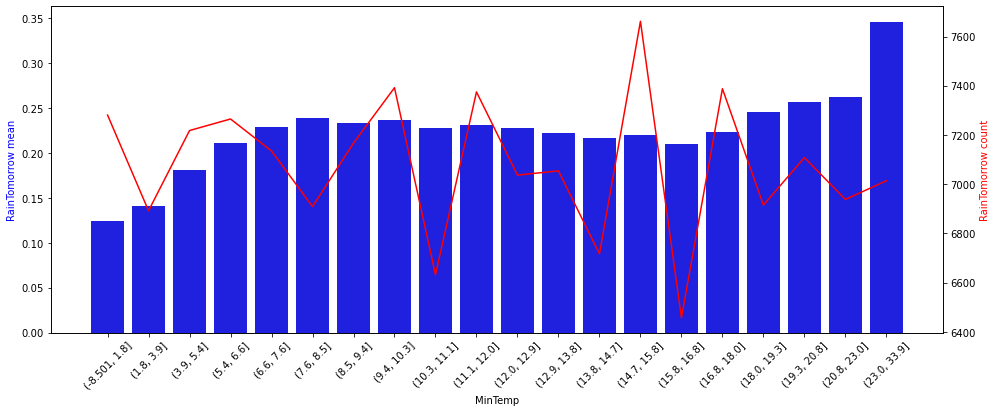

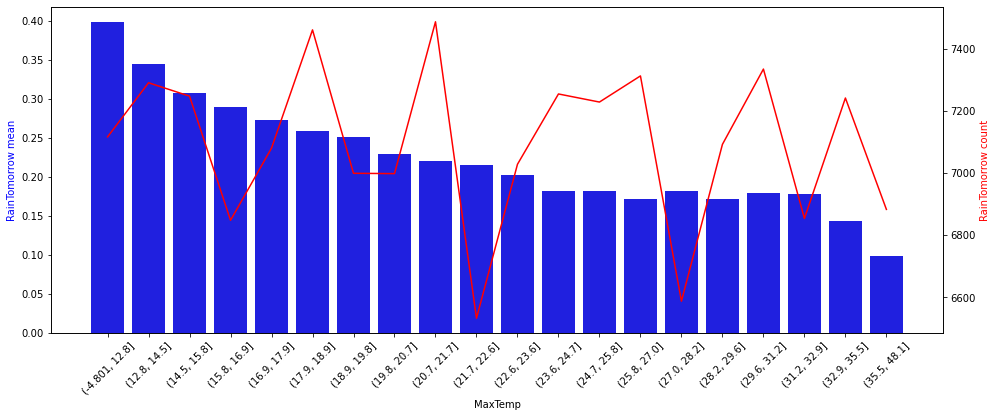

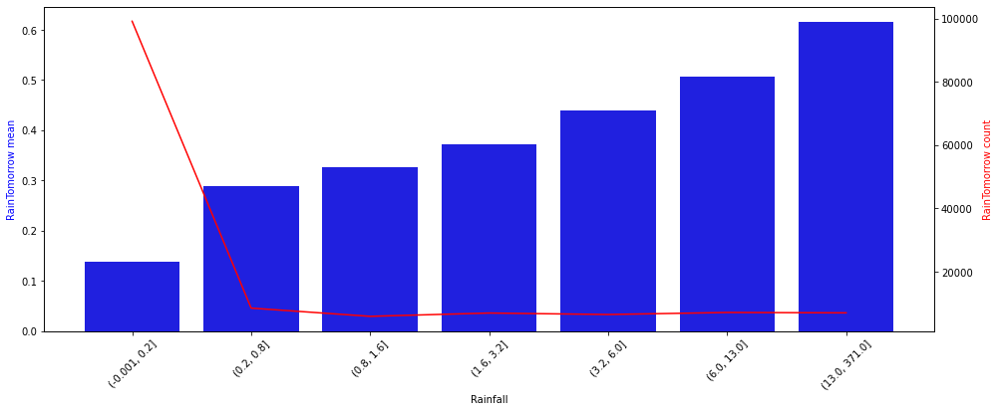

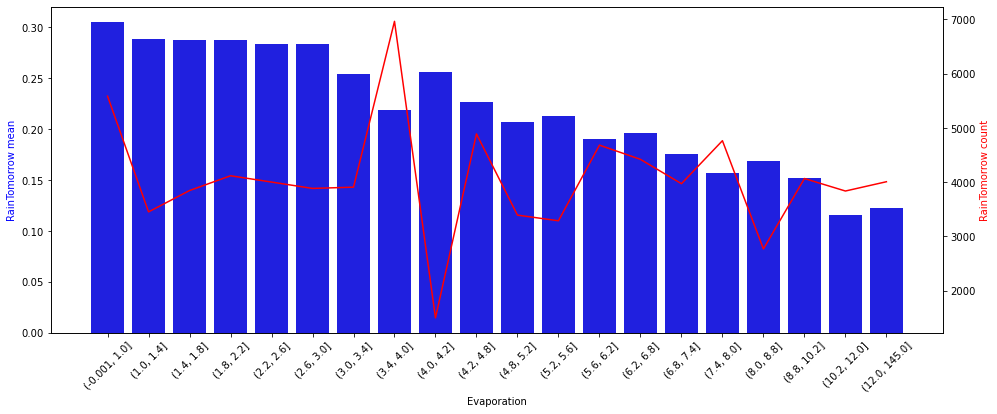

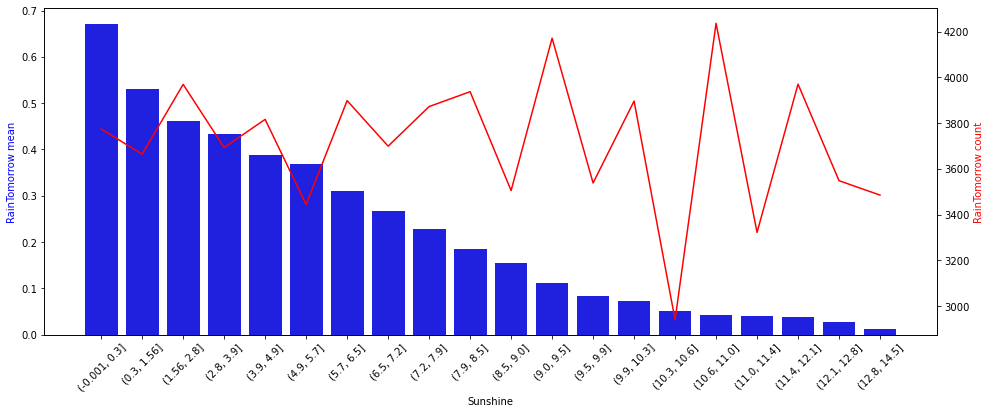

...

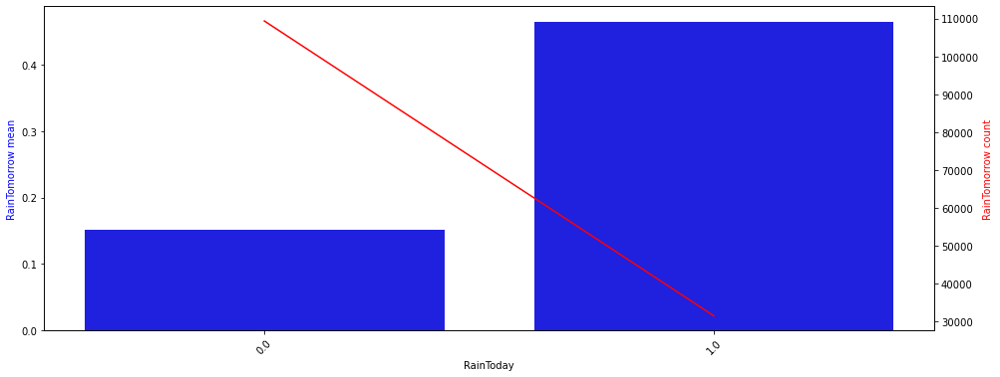

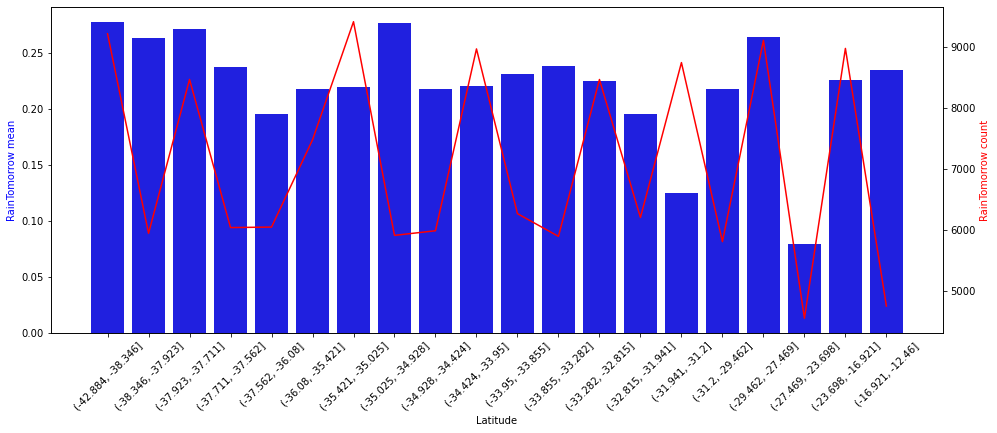

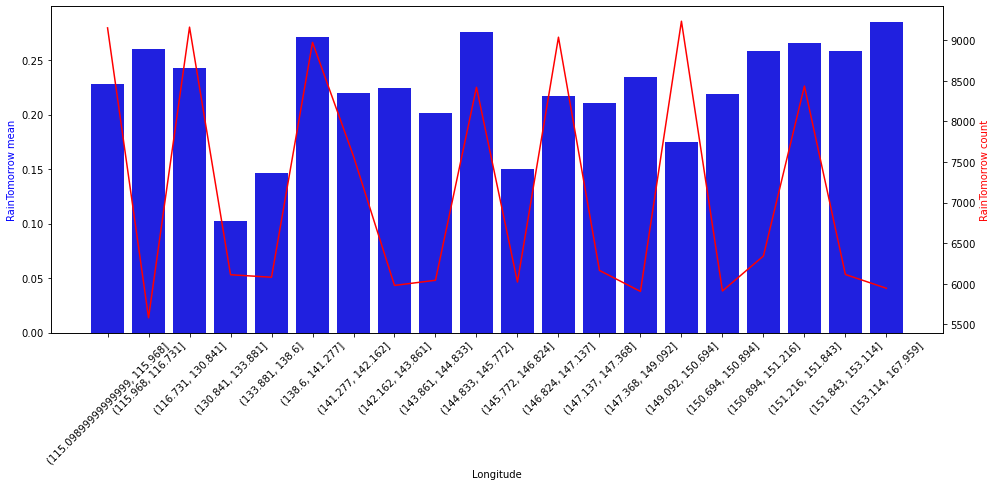

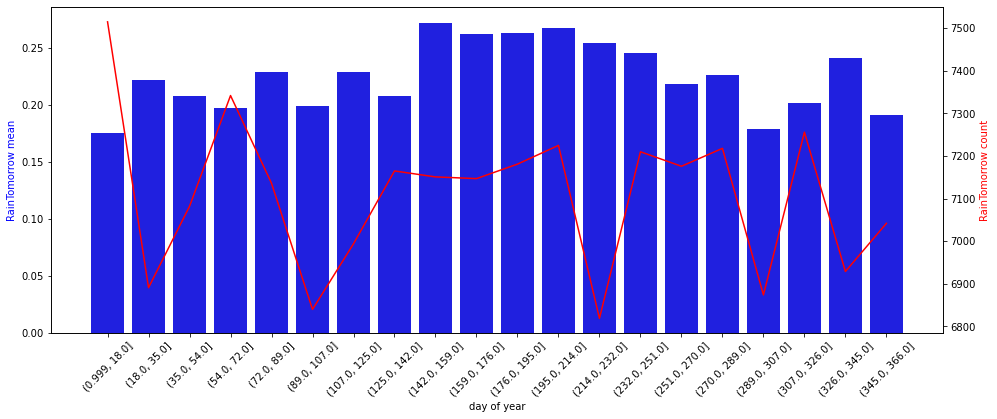

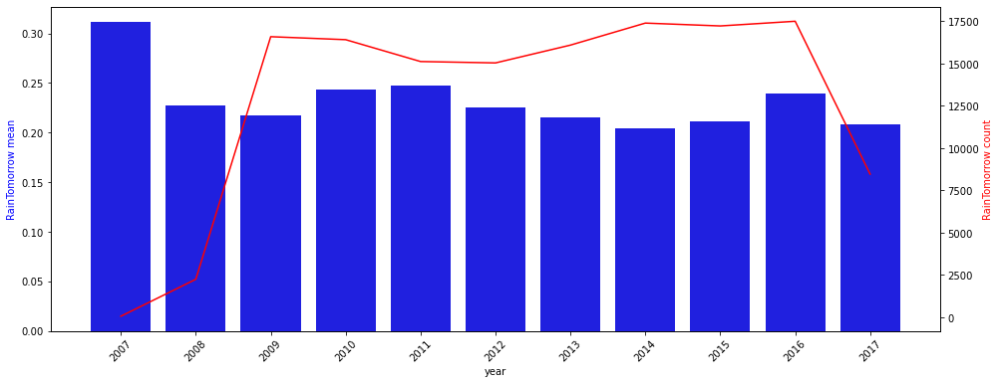

In [9]:
yCol = 'RainTomorrow'
for column in df.columns:
    if column == yCol: continue
    plotOverall(df, column, yCol, 20)

In [10]:
# show 'RainTomorrow' mean within valid and missing values in each feature
res = []
for col in df.columns:
    if col != 'RainTomorrow':
        tmp = df[[col, 'RainTomorrow']]
        tmp['missing'] = df[col].isna()
        tmp = tmp.fillna(-1)
        if (sum(tmp['missing']) > 0):
            tmp = tmp.groupby(by = 'missing').agg({col: 'count', 'RainTomorrow': 'mean'})
            res.append([col, tmp.loc[False, col], tmp.loc[True, col],
                        tmp.loc[False, 'RainTomorrow'], tmp.loc[True, 'RainTomorrow']])
res = pd.DataFrame(res, columns = ['column', 'valid count', 'miss count', 'mean rain in valid', 'mean rain in miss'])
res

,column,valid count,miss count,mean rain in valid,mean rain in miss
0,MinTemp,141556,637,0.223954,0.274725
1,MaxTemp,141871,322,0.224302,0.170807
2,Rainfall,140787,1406,0.221618,0.480797
3,Evaporation,81350,60843,0.219533,0.230396
4,Sunshine,74377,67816,0.226159,0.222013
5,WindGustDir,132863,9330,0.221356,0.264416
6,WindGustSpeed,132923,9270,0.221444,0.263430
7,WindDir9am,132180,10013,0.226630,0.191851
8,WindDir3pm,138415,3778,0.222693,0.278719
9,WindSpeed9am,140845,1348,0.223913,0.252226


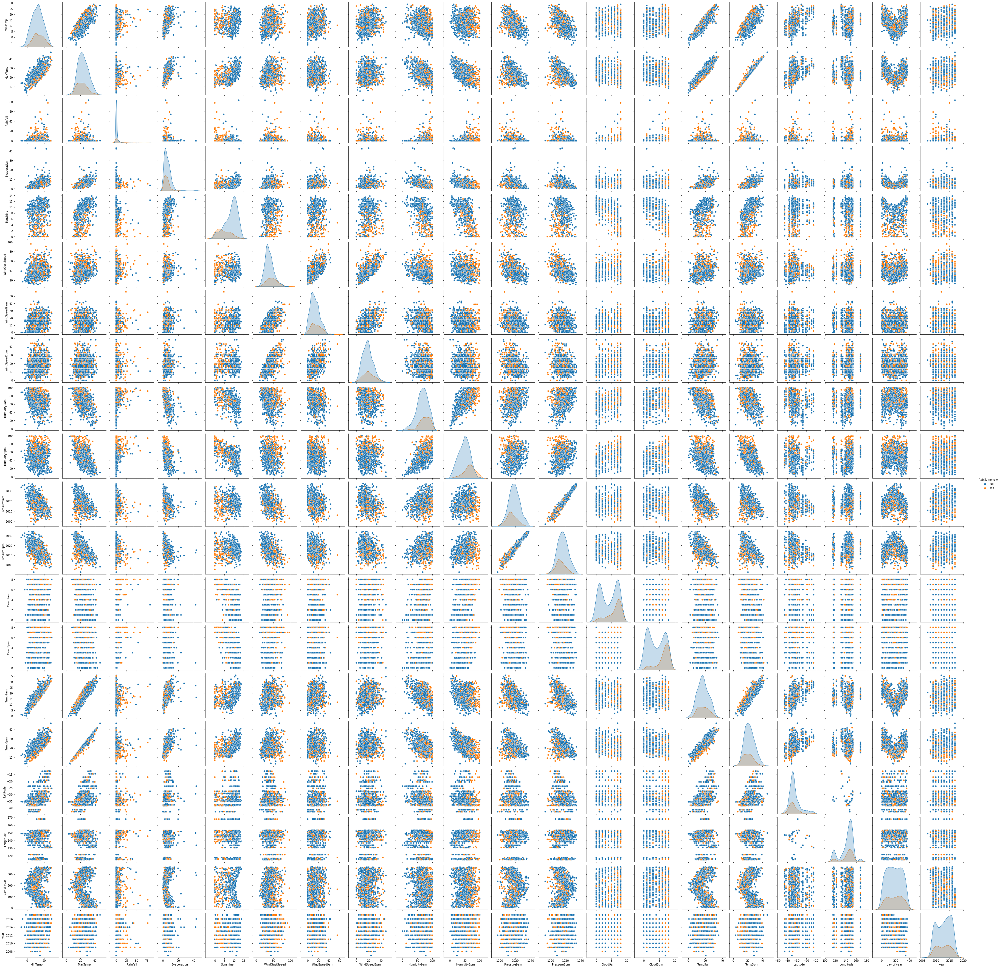

In [11]:
# pair plot
ax = sb.pairplot(data.sample(1000), hue = 'RainTomorrow')

# 3. Classification model to predict RainTomorrow

In [12]:
# drop columns with missing value > 0.2
cols = []
for col in df.columns:
    if sum(df[col].isna()) / df.shape[0] < 0.2:
        cols.append(col)
df = df[cols].dropna()
print('data size after drop columns and missing values:', df.shape)
df.head()

data size after drop columns and missing values: (112925, 21)


,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Latitude,Longitude,day of year,year
0,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,0.0,0.0,-36.080477,146.91628,336,2008
1,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,0.0,0.0,-36.080477,146.91628,337,2008
2,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,0.0,0.0,-36.080477,146.91628,338,2008
3,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,0.0,0.0,-36.080477,146.91628,339,2008
4,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,0.0,0.0,-36.080477,146.91628,340,2008


In [13]:
# one hot encode
df = pd.get_dummies(df, columns = ['WindGustDir', 'WindDir9am', 'WindDir3pm'])

In [14]:
# show target values distribution
df['RainTomorrow'].value_counts()

0.0    87906
1.0    25019
Name: RainTomorrow, dtype: int64

In [15]:
# resample to get balanced data
df_train = df.groupby('RainTomorrow').apply(lambda x: x.sample(n=11000)).reset_index(drop = True)

In [16]:
yCol = 'RainTomorrow'
# obtain balanced training set
y = df_train[yCol]
X = df_train.drop(columns = [yCol])
X_train, _, y_train, _ = train_test_split(X, y, test_size=0.2, random_state=0)

In [17]:
# obtain test set from orginal data
y = df[yCol]
X = df.drop(columns = [yCol])
_, X_test, _, y_test = train_test_split(X, y, test_size=0.2, random_state=35)

In [18]:
# # select best parameters for random forest classifier
# param_grid = { 
#    'n_estimators': [50, 100, 200],
#    'max_depth' : [4,6,10],
#    'criterion' :['gini', 'entropy']
# }
# clf = RandomForestClassifier()

# cv = GridSearchCV(estimator=clf, param_grid=param_grid, cv=3)
# cv.fit(X_train, y_train)
# y_pred = cv.predict(X_test)
# print('cv model report:\n ',classification_report(y_test,y_pred))

In [19]:
clf=RandomForestClassifier()
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
print('report :\n ',classification_report(y_test,y_pred))

report :
                precision    recall  f1-score   support

         0.0       0.95      0.83      0.89     17554
         1.0       0.59      0.86      0.70      5031

    accuracy                           0.84     22585
   macro avg       0.77      0.85      0.80     22585
weighted avg       0.87      0.84      0.85     22585



Text(0.5, 0, 'Threshold')

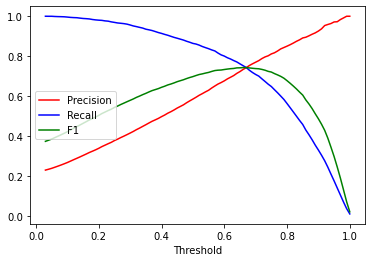

In [20]:
# tuning threshold for F1 through precision/recall curve
y_scores = clf.predict_proba(X_test)[:,1]
p, r, t = precision_recall_curve(y_test, y_scores)
f1 = 2*p[:-1]*r[:-1]/(r[:-1]+p[:-1])
plt.plot(t, p[:-1], 'r-', label='Precision')
plt.plot(t, r[:-1], 'b-', label='Recall')
plt.plot(t, f1, 'g-', label='F1')
plt.legend(loc='center left')
plt.xlabel('Threshold')

In [21]:
# select 0.65 as the threshold value
y_pred = (clf.predict_proba(X_test)[:, 1] > 0.65)
print('report :\n ',classification_report(y_test,y_pred))

report :
                precision    recall  f1-score   support

         0.0       0.93      0.92      0.93     17554
         1.0       0.73      0.75      0.74      5031

    accuracy                           0.88     22585
   macro avg       0.83      0.84      0.83     22585
weighted avg       0.89      0.88      0.88     22585



# 4. Regression model to predict rainfall tomorrow

In [41]:
# get rainfall tomorrow data
df_tomorrow = data[['Date', 'Rainfall', 'Location']].rename(columns = {'Date': 'Tomorrow', 'Rainfall': 'RainfallTomorrow'})
df_tomorrow['Date'] = df_tomorrow['Tomorrow'] - pd.Timedelta('1d')

In [57]:
df1 = data.merge(df_tomorrow, on = ['Date', 'Location'])
print('data size:', df1.shape)
df1.head()

data size: (145268, 29)


,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Latitude,Longitude,day of year,year,Tomorrow,RainfallTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No,-36.080477,146.91628,336,2008,2008-12-02,0.0
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No,-36.080477,146.91628,337,2008,2008-12-03,0.0
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No,-36.080477,146.91628,338,2008,2008-12-04,0.0
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No,-36.080477,146.91628,339,2008,2008-12-05,1.0
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No,-36.080477,146.91628,340,2008,2008-12-06,0.2


In [58]:
df1 = df1.drop(columns = ['Date', 'Tomorrow', 'Location', 'RainToday', 'RainTomorrow'])[df1['RainfallTomorrow'].notna()]

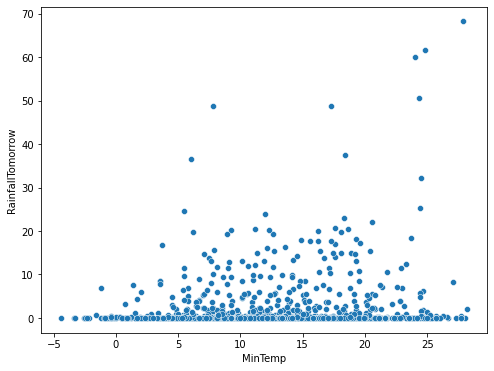

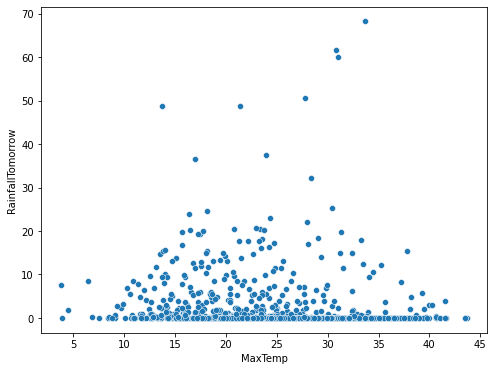

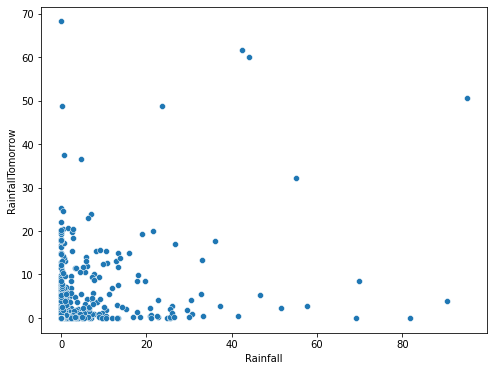

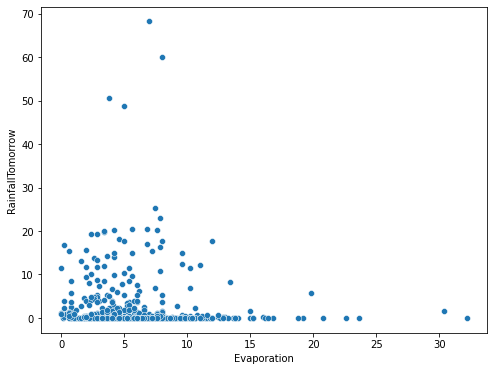

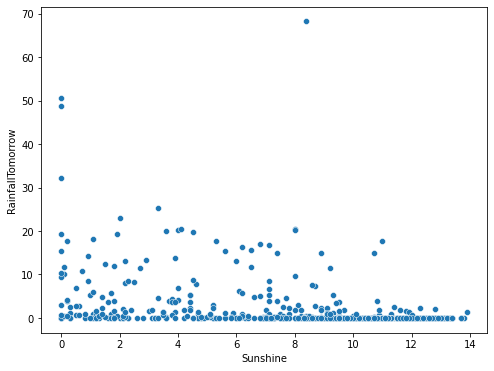

...

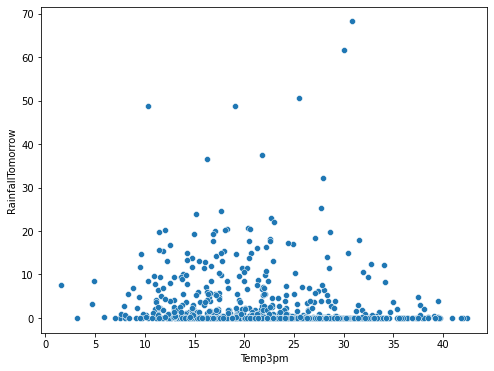

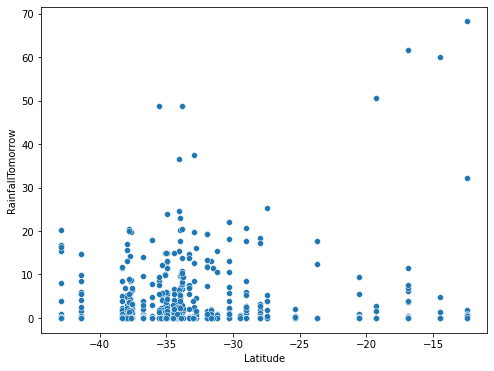

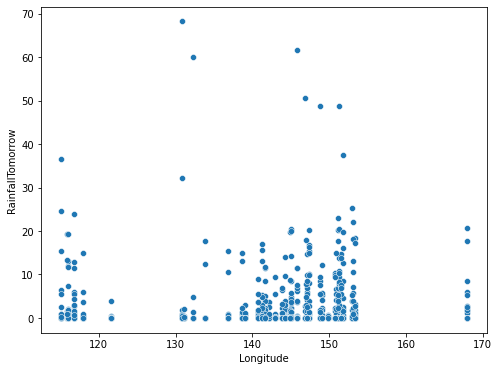

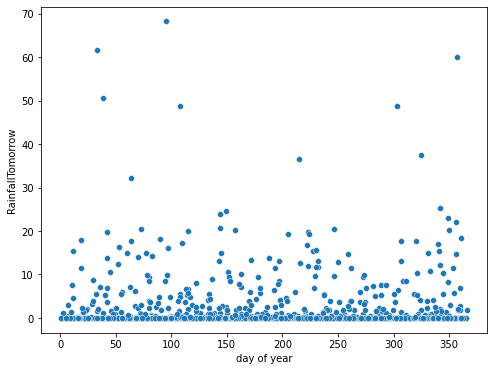

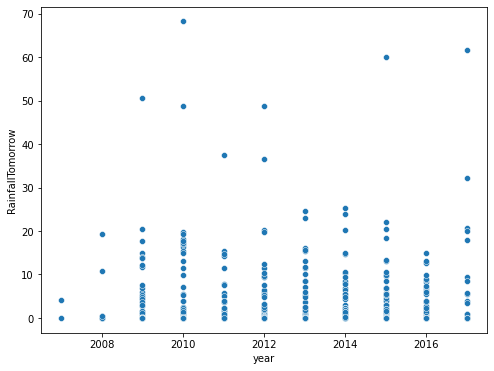

In [44]:
# scatter plot
yCol = 'RainfallTomorrow'
df_plot = df1.sample(1000)
# scatter plot
for col in df1.columns:
    if col != yCol:
        fig = plt.figure(figsize=(8, 6))
        ax = sb.scatterplot(x = col, y = yCol, data = df_plot)
        plt.show()

In [45]:
# drop columns with missing value percentage > 0.2
cols = []
for col in df1.columns:
    if sum(df1[col].isna()) / df1.shape[0] < 0.2:
        cols.append(col)
df2 = df1[cols].dropna()
print('data size after drop columns and missing values:', df2.shape)
df2.head()

data size after drop columns and missing values: (112788, 20)


,MinTemp,MaxTemp,Rainfall,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Temp9am,Temp3pm,Latitude,Longitude,day of year,year,RainfallTomorrow
0,13.4,22.9,0.6,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,16.9,21.8,-36.080477,146.91628,336,2008,0.0
1,7.4,25.1,0.0,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,17.2,24.3,-36.080477,146.91628,337,2008,0.0
2,12.9,25.7,0.0,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,21.0,23.2,-36.080477,146.91628,338,2008,0.0
3,9.2,28.0,0.0,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,18.1,26.5,-36.080477,146.91628,339,2008,1.0
4,17.5,32.3,1.0,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,17.8,29.7,-36.080477,146.91628,340,2008,0.2


In [46]:
# one hot encoder
df2 = pd.get_dummies(df2, columns = ['WindGustDir', 'WindDir9am', 'WindDir3pm'])

In [55]:
def modelTrain(data, model):
    y = data[yCol]
    X = data.drop(columns = [yCol])
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=3)
    
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    print('train set r2 score:', r2_score(y_train,y_train_pred))
    y_test_pred = model.predict(X_test)
    print('test set r2 score:', r2_score(y_test,y_test_pred))

In [62]:
cateCols = []
numCols = []
for col in df1.columns:
    if types.is_object_dtype(df2[col].dtype):
        cateCols.append(col)
    else:
        numCols.append(col)

In [65]:
preprocessor = ColumnTransformer(
    transformers=[('num', SimpleImputer(strategy = 'mean'), numCols),
                  ('cat', SimpleImputer(strategy = 'most_frequent'), cateCols)]
)
df3 = pd.DataFrame(preprocessor.fit_transform(df1), columns = numCols + cateCols)
df3.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Latitude,Longitude,day of year,year,RainfallTomorrow,WindGustDir,WindDir9am,WindDir3pm
0,13.4,22.9,0.6,5.468502,7.624672,44.0,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,4.503294,16.9,21.8,-36.080477,146.91628,336.0,2008.0,0.0,W,W,WNW
1,7.4,25.1,0.0,5.468502,7.624672,44.0,4.0,22.0,44.0,25.0,1010.6,1007.8,4.43733,4.503294,17.2,24.3,-36.080477,146.91628,337.0,2008.0,0.0,WNW,NNW,WSW
2,12.9,25.7,0.0,5.468502,7.624672,46.0,19.0,26.0,38.0,30.0,1007.6,1008.7,4.43733,2.0,21.0,23.2,-36.080477,146.91628,338.0,2008.0,0.0,WSW,W,WSW
3,9.2,28.0,0.0,5.468502,7.624672,24.0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.43733,4.503294,18.1,26.5,-36.080477,146.91628,339.0,2008.0,1.0,NE,SE,E
4,17.5,32.3,1.0,5.468502,7.624672,41.0,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,-36.080477,146.91628,340.0,2008.0,0.2,W,ENE,NW


In [66]:
# one hot encoder
df3 = pd.get_dummies(df3, columns = ['WindGustDir', 'WindDir9am', 'WindDir3pm'])

In [68]:
# build random forest regression model
model = RandomForestRegressor(n_estimators = 200)
modelTrain(df3, model)

train set r2 score: 0.90932856918061
test set r2 score: 0.34518805586623535
